# We pre-process the data, to ensure that horns are isolated

In [1]:
import os
import librosa
import numpy as np
import pandas as pd
import noisereduce
import seaborn as sns
import matplotlib.pyplot as plt

from IPython.display import Audio

In [2]:
audio_signal, _ = librosa.load('audio-test2.mp3', mono=True, sr=16000)
Audio(data=audio_signal, rate=16000)

<Axes: >

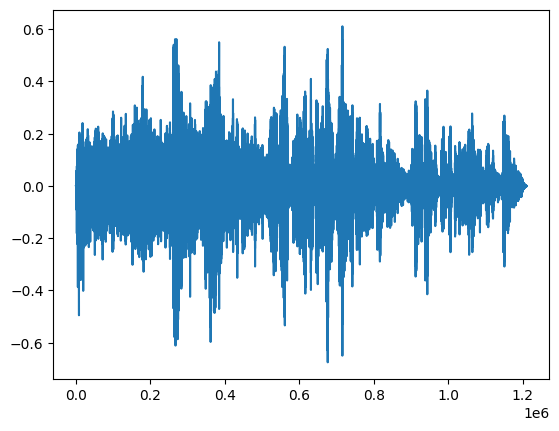

In [3]:
sns.lineplot(audio_signal)

In [4]:
preemph_signal = librosa.effects.preemphasis(audio_signal, coef=1.)
Audio(data=preemph_signal, rate=16000)

In [5]:
denoised = noisereduce.reduce_noise(audio_signal, sr=16000, n_fft=2048, stationary=True)
Audio(data=denoised, rate=16000)

<Axes: >

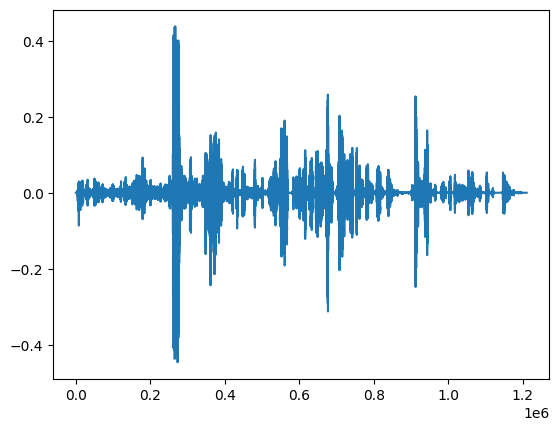

In [6]:
sns.lineplot(denoised)

## Pass Denoised signal to YAMNet

In [7]:
import kagglehub
import tensorflow as tf
from tensorflow.keras import models 
import pandas as pd

I0000 00:00:1779440416.750349   13121 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1779440420.421041   13121 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


In [8]:
yamnet_model_download = kagglehub.model_download('google/yamnet/tensorFlow2/yamnet')
yamnet = tf.saved_model.load(yamnet_model_download)

E0000 00:00:1779440443.819187   13121 cuda_platform.cc:52] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [9]:
scores, embeddings, spectogram = yamnet(audio_signal)

W0000 00:00:1779441475.895884   14890 cpu_allocator_impl.cc:82] Allocation of 30867456 exceeds 10% of free system memory.
W0000 00:00:1779441475.938408   14890 cpu_allocator_impl.cc:82] Allocation of 30867456 exceeds 10% of free system memory.
W0000 00:00:1779441475.999394   14890 cpu_allocator_impl.cc:82] Allocation of 30867456 exceeds 10% of free system memory.
W0000 00:00:1779441476.034877   14890 cpu_allocator_impl.cc:82] Allocation of 61734912 exceeds 10% of free system memory.
W0000 00:00:1779441476.134789   14890 cpu_allocator_impl.cc:82] Allocation of 30867456 exceeds 10% of free system memory.


In [10]:
len(scores), len(embeddings)

(157, 157)

<Axes: >

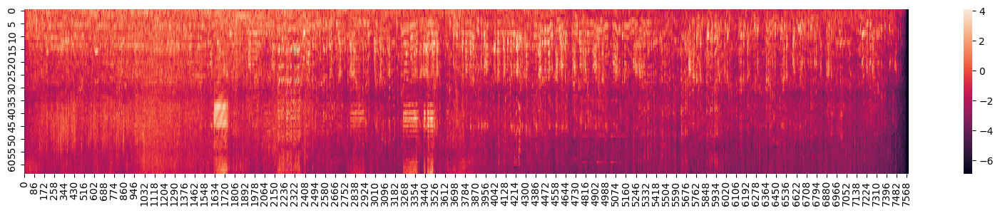

In [11]:
plt.figure(figsize=(20, 3))
sns.heatmap(spectogram.numpy().T)

In [12]:
classes_path = os.path.join(yamnet_model_download, 'assets/yamnet_class_map.csv')
classes = pd.read_csv(classes_path)

In [13]:
fahh = scores.numpy()

In [18]:
np.sort(fahh, axis=1)

array([[1.92179203e-17, 2.45562064e-17, 2.64056317e-17, ...,
        3.19542617e-01, 4.27947134e-01, 5.95587015e-01],
       [6.69523641e-14, 1.27051608e-13, 1.74907086e-13, ...,
        5.13003953e-02, 1.24630988e-01, 4.08943444e-01],
       [4.81459100e-12, 1.44762275e-11, 1.56836748e-11, ...,
        4.81827520e-02, 7.86062628e-02, 5.55873096e-01],
       ...,
       [1.65356455e-12, 2.11996566e-12, 5.21909599e-12, ...,
        1.53466957e-02, 2.77138092e-02, 9.74489331e-01],
       [6.70380973e-14, 1.17706965e-13, 5.16286775e-13, ...,
        8.38185940e-03, 6.04023077e-02, 9.74985301e-01],
       [8.57918714e-09, 1.62812093e-08, 6.38479563e-08, ...,
        4.03101034e-02, 6.73513189e-02, 1.28678143e-01]],
      shape=(157, 521), dtype=float32)

In [14]:
poo=pd.DataFrame(fahh.argsort(axis=1)[:,-5:]).apply(lambda a: pd.Series([classes.loc[k, 'display_name'] for k in a]), axis=1)

In [15]:
poo.to_csv('bruh.csv')

## Using homegrown CNN for this perpose

In [169]:
poo

,0,1,2,3,4
0,Car,"Outside, urban or manmade",Motor vehicle (road),Motorcycle,Vehicle
1,"Outside, urban or manmade",Vehicle,Motor vehicle (road),Motorcycle,Speech
2,"Outside, rural or natural",Animal,Wild animals,Snake,Speech
3,Horse,Clip-clop,"Outside, urban or manmade",Vehicle,Speech
4,Singing,Crowd,"Outside, urban or manmade",Speech,Music
...,...,...,...,...,...
152,Bow-wow,Animal,"Domestic animals, pets",Dog,Speech
153,"Inside, public space",Chatter,Conversation,"Inside, large room or hall",Speech
154,"Inside, public space","Inside, large room or hall","Narration, monologue",Conversation,Speech
155,"Outside, urban or manmade",Conversation,"Inside, large room or hall","Narration, monologue",Speech


In [170]:
def check_pattern(a):
    return bool(re.match('horn|alarm|buzz|siren|music', a.lower()))

In [171]:
predicted_horns = np.array([np.vectorize(check_pattern)(poo[i]) for i in poo.columns]).any(axis=0)

In [172]:
predicted_horns

array([False, False, False, False,  True,  True,  True, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False,  True, False, False,  True,  True,  True,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False,  True,  True, False, False,
        True,  True,  True, False,  True,  True, False,  True, False,
       False, False,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [173]:
indeces = poo.index[predicted_horns]

In [174]:
indeces

Index([  4,   5,   6,   8,  25,  30,  33,  34,  35,  40,  58,  59,  67,  87,
        95,  96,  99, 100, 101, 103, 104, 106, 110, 111, 131, 138, 139, 140],
      dtype='int64')

## PCA on the embeddnigs of the found indeces

In [272]:
import sklearn
import re

In [301]:
pca = sklearn.decomposition.PCA(n_components=5)
pca

,"n_components n_components: int, float or 'mle', default=NoneNumber of components to keep.if n_components is not set all components are kept:: n_components == min(n_samples, n_features)If ``n_components == 'mle'`` and ``svd_solver == 'full'``, Minka'sMLE is used to guess the dimension. Use of ``n_components == 'mle'``will interpret ``svd_solver == 'auto'`` as ``svd_solver == 'full'``.If ``0 < n_components < 1`` and ``svd_solver == 'full'``, select thenumber of components such that the amount of variance that needs to beexplained is greater than the percentage specified by n_components.If ``svd_solver == 'arpack'``, the number of components must bestrictly less than the minimum of n_features and n_samples.Hence, the None case results in:: n_components == min(n_samples, n_features) - 1",5
,"copy copy: bool, default=TrueIf False, data passed to fit are overwritten and runningfit(X).transform(X) will not yield the expected results,use fit_transform(X) instead.",True
,"whiten whiten: bool, default=FalseWhen True (False by default) the `components_` vectors are multipliedby the square root of n_samples and then divided by the singular valuesto ensure uncorrelated outputs with unit component-wise variances.Whitening will remove some information from the transformed signal(the relative variance scales of the components) but can sometimeimprove the predictive accuracy of the downstream estimators bymaking their data respect some hard-wired assumptions.",False
,"svd_solver svd_solver: {'auto', 'full', 'covariance_eigh', 'arpack', 'randomized'}, default='auto'""auto"" : The solver is selected by a default 'auto' policy is based on `X.shape` and `n_components`: if the input data has fewer than 1000 features and more than 10 times as many samples, then the ""covariance_eigh"" solver is used. Otherwise, if the input data is larger than 500x500 and the number of components to extract is lower than 80% of the smallest dimension of the data, then the more efficient ""randomized"" method is selected. Otherwise the exact ""full"" SVD is computed and optionally truncated afterwards.""full"" : Run exact full SVD calling the standard LAPACK solver via `scipy.linalg.svd` and select the components by postprocessing""covariance_eigh"" : Precompute the covariance matrix (on centered data), run a classical eigenvalue decomposition on the covariance matrix typically using LAPACK and select the components by postprocessing. This solver is very efficient for n_samples >> n_features and small n_features. It is, however, not tractable otherwise for large n_features (large memory footprint required to materialize the covariance matrix). Also note that compared to the ""full"" solver, this solver effectively doubles the condition number and is therefore less numerical stable (e.g. on input data with a large range of singular values).""arpack"" : Run SVD truncated to `n_components` calling ARPACK solver via `scipy.sparse.linalg.svds`. It requires strictly `0 < n_components < min(X.shape)`""randomized"" : Run randomized SVD by the method of Halko et al... versionadded:: 0.18.0.. versionchanged:: 1.5 Added the 'covariance_eigh' solver.",'auto'
,"tol tol: float, default=0.0Tolerance for singular values computed by svd_solver == 'arpack'.Must be of range [0.0, infinity)... versionadded:: 0.18.0",0.0
,"iterated_power iterated_power: int or 'auto', default='auto'Number of iterations for the power method computed bysvd_solver == 'randomized'.Must be of range [0, infinity)... versionadded:: 0.18.0",'auto'
,"n_oversamples n_oversamples: int, default=10This parameter is only relevant when `svd_solver=""randomized""`.It corresponds to the additional number of random vectors to sample therange of `X` so as to ensure proper conditioning. See:func:`~sklearn.utils.extmath.randomized_svd` for more details... versionadded:: 1.1",10
,"power_iteration_normalizer power_iteration_normalizer: {'auto', 'QR', 'LU', 'none'}, default='auto'Power iteration normalizer for randomized SVD 

In [302]:
smool = pca.fit_transform(embeddings.numpy()[indeces])

<Axes: >

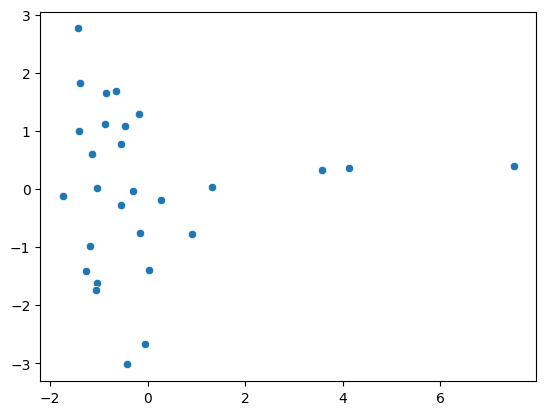

In [303]:
sns.scatterplot(x=smool.T[0], y=smool.T[1])

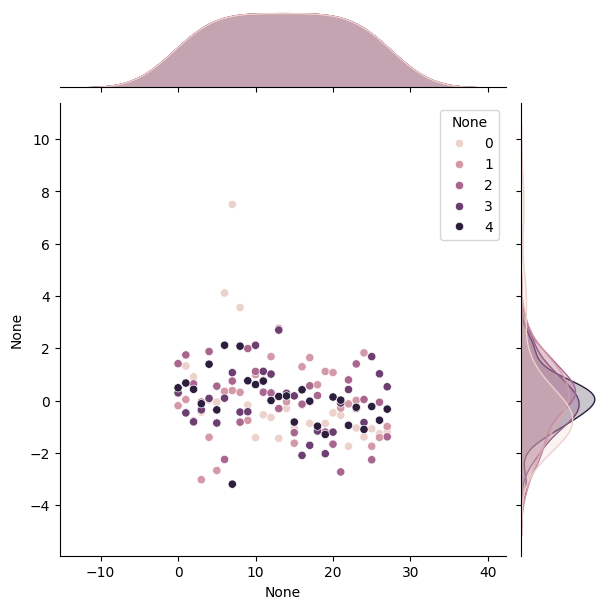

In [304]:
sns.jointplot(pd.DataFrame(smool))

## K-Means cluster the thing

In [282]:
kmeans = sklearn.cluster.KMeans(n_clusters=4)
kmeans

,"n_clusters n_clusters: int, default=8The number of clusters to form as well as the number ofcentroids to generate.For an example of how to choose an optimal value for `n_clusters` refer to:ref:`sphx_glr_auto_examples_cluster_plot_kmeans_silhouette_analysis.py`.",4
,"init init: {'k-means++', 'random'}, callable or array-like of shape (n_clusters, n_features), default='k-means++'Method for initialization:* 'k-means++' : selects initial cluster centroids using sampling based on an empirical probability distribution of the points' contribution to the overall inertia. This technique speeds up convergence. The algorithm implemented is ""greedy k-means++"". It differs from the vanilla k-means++ by making several trials at each sampling step and choosing the best centroid among them.* 'random': choose `n_clusters` observations (rows) at random from data for the initial centroids.* If an array is passed, it should be of shape (n_clusters, n_features) and gives the initial centers.* If a callable is passed, it should take arguments X, n_clusters and a random state and return an initialization.For an example of how to use the different `init` strategies, see:ref:`sphx_glr_auto_examples_cluster_plot_kmeans_digits.py`.For an evaluation of the impact of initialization, see the example:ref:`sphx_glr_auto_examples_cluster_plot_kmeans_stability_low_dim_dense.py`.",'k-means++'
,"n_init n_init: 'auto' or int, default='auto'Number of times the k-means algorithm is run with different centroidseeds. The final results is the best output of `n_init` consecutive runsin terms of inertia. Several runs are recommended for sparsehigh-dimensional problems (see :ref:`kmeans_sparse_high_dim`).When `n_init='auto'`, the number of runs depends on the value of init:10 if using `init='random'` or `init` is a callable;1 if using `init='k-means++'` or `init` is an array-like... versionadded:: 1.2 Added 'auto' option for `n_init`... versionchanged:: 1.4 Default value for `n_init` changed to `'auto'`.",'auto'
,"max_iter max_iter: int, default=300Maximum number of iterations of the k-means algorithm for asingle run.",300
,"tol tol: float, default=1e-4Relative tolerance with regards to Frobenius norm of the differencein the cluster centers of two consecutive iterations to declareconvergence.",0.0001
,"verbose verbose: int, default=0Verbosity mode.",0
,"random_state random_state: int, RandomState instance or None, default=NoneDetermines random number generation for centroid initialization. Usean int to make the randomness deterministic.See :term:`Glossary `.",None
,"copy_x copy_x: bool, default=TrueWhen pre-computing distances it is more numerically accurate to centerthe data first. If copy_x is True (default), then the original data isnot modified. If False, the original data is modified, and put backbefore the function returns, but small numerical differences may beintroduced by subtracting and then adding the data mean. Note that ifthe original data is not C-contiguous, a copy will be made even ifcopy_x is False. If the original data is sparse, but not in CSR format,a copy will be made even if copy_x is False.",True
,"algorithm algorithm: {""lloyd"", ""elkan""}, default=""lloyd""K-means algorithm to use. The classical EM-style algorithm is `""lloyd""`.The `""elkan""` variation can be more efficient on some datasets withwell-defined clusters, by using the triangle inequality. However it'smore memory intensive due to the allocation of an extra array of shape`(n_samples, n_clusters)`... versionchanged:: 0.18 Added Elkan algorithm.. versionchanged:: 1.1 Renamed ""full"" to ""lloyd"", and deprecated ""auto"" and ""full"". Changed ""auto"" to use ""lloyd"" instead of ""elkan"".",'lloyd'


In [291]:
looper = kmeans.fit_predict(smool)
looper

array([2, 2, 2, 3, 3, 3, 1, 1, 1, 2, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 3, 3, 3], dtype=int32)

<Axes: >

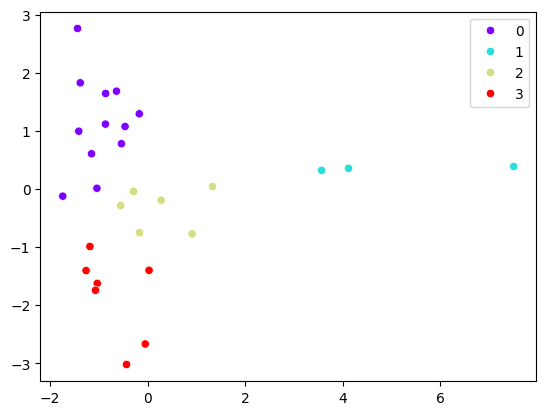

In [292]:
sns.scatterplot(x=smool.T[0], y=smool.T[1], hue=looper, palette='rainbow')

## HDBSCAN Version of the thing

In [293]:
hdbscan = sklearn.cluster.HDBSCAN(copy=True, metric='cosine')
hdbscan

,"min_cluster_size min_cluster_size: int, default=5The minimum number of samples in a group for that group to beconsidered a cluster; groupings smaller than this size will be leftas noise.",5
,"min_samples min_samples: int, default=NoneThe parameter `k` used to calculate the distance between a point`x_p` and its k-th nearest neighbor.When `None`, defaults to `min_cluster_size`.",None
,"cluster_selection_epsilon cluster_selection_epsilon: float, default=0.0A distance threshold. Clusters below this value will be merged.See [5]_ for more information.",0.0
,"max_cluster_size max_cluster_size: int, default=NoneA limit to the size of clusters returned by the `""eom""` clusterselection algorithm. There is no limit when `max_cluster_size=None`.Has no effect if `cluster_selection_method=""leaf""`.",None
,"metric metric: str or callable, default='euclidean'The metric to use when calculating distance between instances in afeature array.- If metric is a string or callable, it must be one of the options allowed by :func:`~sklearn.metrics.pairwise_distances` for its metric parameter.- If metric is ""precomputed"", X is assumed to be a distance matrix and must be square.",'cosine'
,"metric_params metric_params: dict, default=NoneArguments passed to the distance metric.",None
,"alpha alpha: float, default=1.0A distance scaling parameter as used in robust single linkage.See [3]_ for more information.",1.0
,"algorithm algorithm: {""auto"", ""brute"", ""kd_tree"", ""ball_tree""}, default=""auto""Exactly which algorithm to use for computing core distances; By defaultthis is set to `""auto""` which attempts to use a:class:`~sklearn.neighbors.KDTree` tree if possible, otherwise it usesa :class:`~sklearn.neighbors.BallTree` tree. Both `""kd_tree""` and`""ball_tree""` algorithms use the:class:`~sklearn.neighbors.NearestNeighbors` estimator.If the `X` passed during `fit` is sparse or `metric` is invalid forboth :class:`~sklearn.neighbors.KDTree` and:class:`~sklearn.neighbors.BallTree`, then it resolves to use the`""brute""` algorithm.",'auto'
,"leaf_size leaf_size: int, default=40Leaf size for trees responsible for fast nearest neighbour queries whena KDTree or a BallTree are used as core-distance algorithms. A largedataset size and small `leaf_size` may induce excessive memory usage.If you are running out of memory consider increasing the `leaf_size`parameter. Ignored for `algorithm=""brute""`.",40
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel to calculate distances.`None` means 1 unless in a :obj:`joblib.parallel_backend` context.`-1` means using all processors. See :term:`Glossary `for more details.",None
,"cluster_selection_method cluster_selection_method: {""eom"", ""leaf""}, default=""eom""The method used to select clusters from the condensed tree. Thestandard approach for HDBSCAN* is to use an Excess of Mass (`""eom""`)algorithm to find the most persistent clusters. Alternatively you caninstead select the clusters at the leaves of the tree -- this providesthe most fine grained and homogeneous clusters.",'eom'


In [298]:
looper = hdbscan.fit_predict(smool)
looper

array([ 0,  0,  0,  1, -1, -1,  0,  0,  0,  1,  2,  2,  2,  2, -1,  1,  2,
        2,  2,  2,  2,  1, -1,  1,  2,  1,  1,  1])

<Axes: >

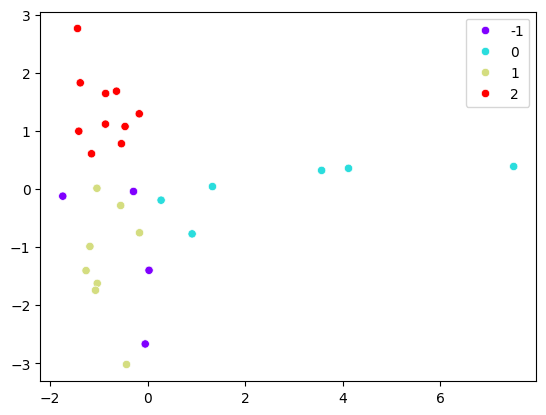

In [300]:
sns.scatterplot(x=smool.T[0], y=smool.T[1], hue=looper, palette='rainbow')

In [20]:
np.arange(0, 3, 0.5)

array([0. , 0.5, 1. , 1.5, 2. , 2.5])

In [21]:
len(embeddings)

157